# This Notebook will be used for the IBM Data Science Capstone Project on predicting severity of road accidents.

In [1]:
import pandas as pd
import numpy as np

In [3]:
print('Hello Capstone Project Course!')

Hello Capstone Project Course!


In [2]:
#loading the csv file into the dataframe
file_name='https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv'
df=pd.read_csv(file_name)
df.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (33) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [4]:
#checking the dimensions of the dataframe
df.shape

(194673, 38)

## Data Cleaning

In [3]:
#dropping unnecessary attributes from the dataframe
df.drop(columns=['OBJECTID','SEVERITYDESC','INCKEY', 'ADDRTYPE','COLLISIONTYPE','JUNCTIONTYPE','REPORTNO',
                 'COLDETKEY', 'INTKEY','STATUS','EXCEPTRSNCODE','EXCEPTRSNDESC','CROSSWALKKEY','ST_COLCODE',
                 'SEGLANEKEY','SDOTCOLNUM','ST_COLDESC','SDOT_COLCODE','SDOT_COLDESC','SEVERITYCODE.1'], inplace=True)

In [4]:
#dropping rows that have no data in the X,Y Coordinates, location and the road and weather condition attrbutes
df.dropna(subset=['X', 'Y','ROADCOND', 'LIGHTCOND','WEATHER','LOCATION'],inplace=True)

In [7]:
df.head()

,SEVERITYCODE,X,Y,LOCATION,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INCDATE,INCDTTM,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,HITPARKEDCAR
0,2,-122.323148,47.703140,5TH AVE NE AND NE 103RD ST,2,0,0,2,2013/03/27 00:00:00+00,3/27/2013 2:54:00 PM,NaN,N,Overcast,Wet,Daylight,NaN,NaN,N
1,1,-122.347294,47.647172,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,2,0,0,2,2006/12/20 00:00:00+00,12/20/2006 6:55:00 PM,NaN,0,Raining,Wet,Dark - Street Lights On,NaN,NaN,N
2,1,-122.334540,47.607871,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,4,0,0,3,2004/11/18 00:00:00+00,11/18/2004 10:20:00 AM,NaN,0,Overcast,Dry,Daylight,NaN,NaN,N
3,1,-122.334803,47.604803,2ND AVE BETWEEN MARION ST AND MADISON ST,3,0,0,3,2013/03/29 00:00:00+00,3/29/2013 9:26:00 AM,NaN,N,Clear,Dry,Daylight,NaN,NaN,N
4,2,-122.306426,47.545739,SWIFT AVE S AND SWIFT AV OFF RP,2,0,0,2,2004/01/28 00:00:00+00,1/28/2004 8:04:00 AM,NaN,0,Raining,Wet,Daylight,NaN,NaN,N


### We see that there a lot of NaN values in the Columns labelled: INATTENTIONID, UNDERINFL, SPEEDING, PEDROWNOTGRNT and HITPARKEDCAR

In [5]:
#Homogenising the value and replacing the missing values with a default value based on observation and intuition
df['INATTENTIONIND'] = df['INATTENTIONIND'].replace(np.nan, 0)
df['INATTENTIONIND'] = df['INATTENTIONIND'].replace('Yes', 1)
df['INATTENTIONIND'] = df['INATTENTIONIND'].replace('Y', 1)
df['UNDERINFL'] = df['UNDERINFL'].replace('N', 0)
df['UNDERINFL'] = df['UNDERINFL'].replace(np.nan, 0)
df['UNDERINFL'] = df['UNDERINFL'].replace('Y', 1)
df['SPEEDING']=df['SPEEDING'].replace(np.nan,0)
df['SPEEDING']=df['SPEEDING'].replace('N',0)
df['SPEEDING']=df['SPEEDING'].replace('Y',1)
df['PEDROWNOTGRNT'] = df['PEDROWNOTGRNT'].replace(np.nan, 0)
df['PEDROWNOTGRNT'] = df['PEDROWNOTGRNT'].replace('Y', 1)
df['PEDROWNOTGRNT'] = df['PEDROWNOTGRNT'].replace('N', 0)
df['HITPARKEDCAR']=df['HITPARKEDCAR'].replace(np.nan,0)
df['HITPARKEDCAR']=df['HITPARKEDCAR'].replace('Y',1)
df['HITPARKEDCAR']=df['HITPARKEDCAR'].replace('N',0)

In [6]:
#changing date format
df['INCDATE'] = pd.to_datetime(df['INCDATE'])
df['DAY'] = df['INCDATE'].dt.day_name()
df['INCDTTM'] = pd.to_datetime(df['INCDTTM'])
df['HOUR'] = df['INCDTTM'].dt.hour

In [9]:
df.head()

,SEVERITYCODE,X,Y,LOCATION,PERSONCOUNT,PEDCOUNT,PEDCYLCOUNT,VEHCOUNT,INCDATE,INCDTTM,INATTENTIONIND,UNDERINFL,WEATHER,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SPEEDING,HITPARKEDCAR,DAY,HOUR
0,2,-122.323148,47.703140,5TH AVE NE AND NE 103RD ST,2,0,0,2,2013-03-27 00:00:00+00:00,2013-03-27 14:54:00,0,0,Overcast,Wet,Daylight,0,0,0,Wednesday,14
1,1,-122.347294,47.647172,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,2,0,0,2,2006-12-20 00:00:00+00:00,2006-12-20 18:55:00,0,0,Raining,Wet,Dark - Street Lights On,0,0,0,Wednesday,18
2,1,-122.334540,47.607871,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,4,0,0,3,2004-11-18 00:00:00+00:00,2004-11-18 10:20:00,0,0,Overcast,Dry,Daylight,0,0,0,Thursday,10
3,1,-122.334803,47.604803,2ND AVE BETWEEN MARION ST AND MADISON ST,3,0,0,3,2013-03-29 00:00:00+00:00,2013-03-29 09:26:00,0,0,Clear,Dry,Daylight,0,0,0,Friday,9
4,2,-122.306426,47.545739,SWIFT AVE S AND SWIFT AV OFF RP,2,0,0,2,2004-01-28 00:00:00+00:00,2004-01-28 08:04:00,0,0,Raining,Wet,Daylight,0,0,0,Wednesday,8


### Next step for cleaning unecessary data, checking various values of the three attributes ROADCOND,WEATHER and LIGHTCOND

In [10]:
df['ROADCOND'].value_counts()

Dry               121871
Wet                46009
Unknown            13795
Ice                 1174
Snow/Slush           984
Other                116
Standing Water       102
Sand/Mud/Dirt         63
Oil                   53
Name: ROADCOND, dtype: int64

In [11]:
df['WEATHER'].value_counts()

Clear                       108833
Raining                      31987
Overcast                     27105
Unknown                      13846
Snowing                        888
Other                          765
Fog/Smog/Smoke                 553
Sleet/Hail/Freezing Rain       112
Blowing Sand/Dirt               49
Severe Crosswind                24
Partly Cloudy                    5
Name: WEATHER, dtype: int64

In [12]:
df['LIGHTCOND'].value_counts()

Daylight                    113522
Dark - Street Lights On      47250
Unknown                      12416
Dusk                          5763
Dawn                          2422
Dark - No Street Lights       1450
Dark - Street Lights Off      1145
Other                          188
Dark - Unknown Lighting         11
Name: LIGHTCOND, dtype: int64

### Removing the instances that have unknown weather, road or light conditions as such data would ambiguity to the model.

In [7]:
df.drop(df.loc[df['ROADCOND']=='Unknown'].index, inplace=True)
df.drop(df.loc[df['WEATHER']=='Unknown'].index, inplace=True)
df.drop(df.loc[df['LIGHTCOND']=='Unknown'].index, inplace=True)

In [14]:
#checking the counts again for all three attributes
df['ROADCOND'].value_counts()

Dry               119406
Wet                45095
Ice                 1071
Snow/Slush           833
Other                 98
Standing Water        95
Sand/Mud/Dirt         57
Oil                   50
Name: ROADCOND, dtype: int64

In [15]:
df['WEATHER'].value_counts()

Clear                       106875
Raining                      31619
Overcast                     26429
Snowing                        819
Fog/Smog/Smoke                 539
Other                          242
Sleet/Hail/Freezing Rain       110
Blowing Sand/Dirt               43
Severe Crosswind                24
Partly Cloudy                    5
Name: WEATHER, dtype: int64

In [16]:
df['LIGHTCOND'].value_counts()

Daylight                    110520
Dark - Street Lights On      45711
Dusk                          5545
Dawn                          2347
Dark - No Street Lights       1339
Dark - Street Lights Off      1074
Other                          160
Dark - Unknown Lighting          9
Name: LIGHTCOND, dtype: int64

### Removing the values in ROADCOND, WEATHER and LIGHTCOND that are way too less in compared to other values 

In [8]:
#We can set a minimum number as 700 for frequency of each condition and remove the conditions that don't satisfy this limit. Basically we try to homogenize the data in this step.
df.drop(df.loc[df['ROADCOND']=='Other'].index, inplace=True)
df.drop(df.loc[df['ROADCOND']=='Standing Water'].index, inplace=True)
df.drop(df.loc[df['ROADCOND']=='Sand/Mud/Dirt'].index, inplace=True)
df.drop(df.loc[df['ROADCOND']=='Oil'].index, inplace=True)
df.drop(df.loc[df['WEATHER']=='Fog/Smog/Smoke'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Other'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Sleet/Hail/Freezing Rain'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Blowing Sand/Dirt'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Severe Crosswind'].index,inplace=True)
df.drop(df.loc[df['WEATHER']=='Partly Cloudy'].index, inplace=True)
df.drop(df.loc[df['LIGHTCOND']=='Other'].index, inplace=True)
df.drop(df.loc[df['LIGHTCOND']=='Dark - Unknown Lighting'].index, inplace=True)

In [18]:
#checking the counts again for all three attributes to see changes
df['ROADCOND'].value_counts()

Dry           118776
Wet            44738
Ice              998
Snow/Slush       789
Name: ROADCOND, dtype: int64

In [19]:
df['WEATHER'].value_counts()

Clear       106701
Raining      31441
Overcast     26348
Snowing        811
Name: WEATHER, dtype: int64

In [20]:
df['LIGHTCOND'].value_counts()

Daylight                    109926
Dark - Street Lights On      45205
Dusk                          5516
Dawn                          2289
Dark - No Street Lights       1314
Dark - Street Lights Off      1051
Name: LIGHTCOND, dtype: int64

In [ ]:
#checking the dimensions of dataframe
df.shape

In [9]:
#creating a new dataframe that will contain only few required attributes for modelling in future
df_new=df[['SEVERITYCODE', 'ROADCOND', 'WEATHER', 'LIGHTCOND','DAY','HOUR','LOCATION','X','Y']].copy()

In [10]:
df_new.head(20)

,SEVERITYCODE,ROADCOND,WEATHER,LIGHTCOND,DAY,HOUR,LOCATION,X,Y
0,2,Wet,Overcast,Daylight,Wednesday,14,5TH AVE NE AND NE 103RD ST,-122.323148,47.703140
1,1,Wet,Raining,Dark - Street Lights On,Wednesday,18,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,-122.347294,47.647172
2,1,Dry,Overcast,Daylight,Thursday,10,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,-122.334540,47.607871
3,1,Dry,Clear,Daylight,Friday,9,2ND AVE BETWEEN MARION ST AND MADISON ST,-122.334803,47.604803
4,2,Wet,Raining,Daylight,Wednesday,8,SWIFT AVE S AND SWIFT AV OFF RP,-122.306426,47.545739
5,1,Dry,Clear,Daylight,Saturday,17,24TH AVE NW AND NW 85TH ST,-122.387598,47.690575
6,1,Wet,Raining,Daylight,Tuesday,0,DENNY WAY AND WESTLAKE AVE,-122.338485,47.618534
7,2,Dry,Clear,Daylight,Wednesday,17,BROADWAY AND E PIKE ST,-122.320780,47.614076
8,1,Dry,Clear,Daylight,Thursday,13,PINE ST BETWEEN 5TH AVE AND 6TH AVE,-122.335930,47.611904
9,2,Dry,Clear,Daylight,Monday,15,41ST AVE SW AND SW THISTLE ST,-122.384700,47.528475


In [22]:
#Getting some data for just the three attributes and creating a dataframe
df_temp=df_new[['SEVERITYCODE', 'ROADCOND', 'WEATHER', 'LIGHTCOND']].copy()

In [23]:
#creating a value count table for each category of the three attributes
df_t=(df_temp.set_index('SEVERITYCODE').stack()
 .groupby(level=[0,1])
 .value_counts()
 .unstack(level=[1,2])
 .fillna(0)
 .sort_index(axis=1))

In [24]:
df_t.head()

LIGHTCOND                           \
             Dark - No Street Lights Dark - Street Lights Off   
SEVERITYCODE                                                    
1                               1015                      756   
2                                299                      295   

                                                          ROADCOND       \
             Dark - Street Lights On  Dawn Daylight  Dusk      Dry  Ice   
SEVERITYCODE                                                              
1                              31350  1513    72602  3648    79843  759   
2                              13855   776    37324  1868    38933  239   

                               WEATHER                           
             Snow/Slush    Wet   Clear Overcast Raining Snowing  
SEVERITYCODE                                                     
1                   643  29639   71678    17866   20690     650  
2                   146  15099   35023     8482   10751     161

## Exploratory data analysis

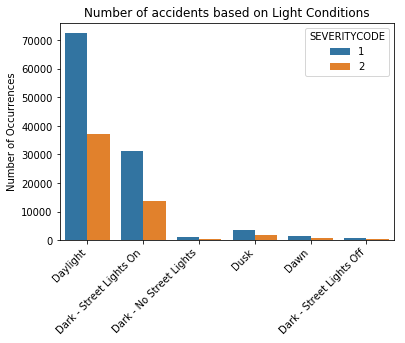

In [13]:
#plotting the number of accidents in both categories 1 and 2 based on light conditions
#importing the plot from matplotlib and seaborn for visualisations
import seaborn as sns
import matplotlib.pyplot as plt
chart=sns.countplot(x='LIGHTCOND', hue ='SEVERITYCODE', data=df_new)
plt.title("Number of accidents based on Light Conditions")
plt.ylabel('Number of Occurrences', fontsize=10)
plt.xlabel(None)
chart.set_xticklabels(
    chart.get_xticklabels(), 
    rotation=45, 
    horizontalalignment='right')
plt.show()

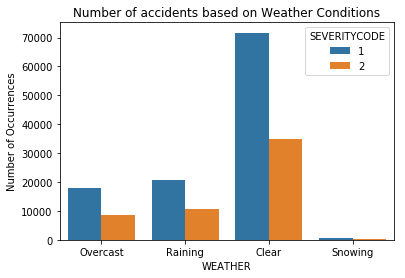

In [12]:
#plotting the number of accidents in both categories 1 and 2 based on weather conditions
chart=sns.countplot(x='WEATHER', hue ='SEVERITYCODE', data=df_new)
plt.title("Number of accidents based on Weather Conditions")
plt.ylabel('Number of Occurrences', fontsize=10)
plt.show()

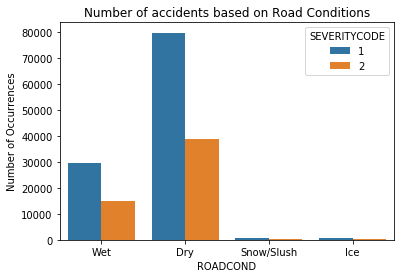

In [14]:
#plotting the number of accidents in both categories 1 and 2 based on road conditions
chart=sns.countplot(x='ROADCOND', hue ='SEVERITYCODE', data=df_new)
plt.title("Number of accidents based on Road Conditions")
plt.ylabel('Number of Occurrences', fontsize=10)
plt.show()

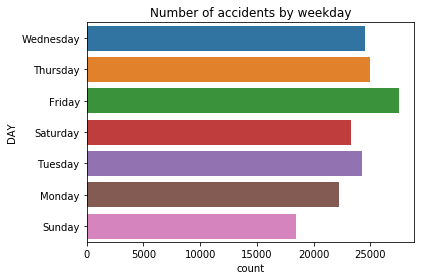

In [15]:
#plotting the accidents against days of week to see if certain days are more accident prone than others
sns.countplot(y = "DAY" , data = df_new)
plt.title("Number of accidents by weekday")
plt.tight_layout()
plt.show()

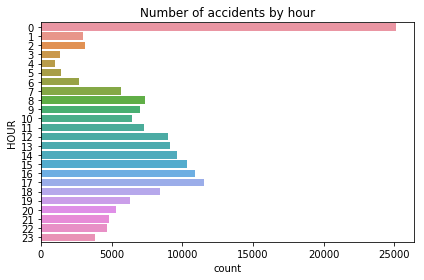

In [18]:
#plotting the accidents against hours of the day to see if certain hours are more accident prone than others 
sns.countplot(y = "HOUR" , data = df_new)
plt.title("Number of accidents by hour")
plt.tight_layout()
plt.show()

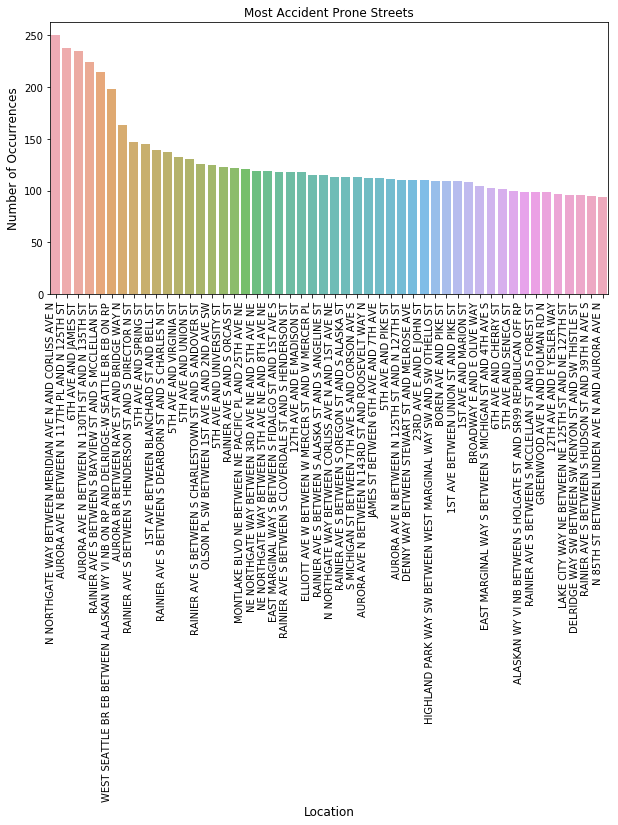

In [17]:
#visualising the top 50 streets and blocks where accidents occur
loc_count  = df['LOCATION'].value_counts()
loc_count = loc_count[:50,]
plt.figure(figsize=(10,5))
chart=sns.barplot(loc_count.index, loc_count.values, alpha=0.8)
plt.title('Most Accident Prone Streets')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Location', fontsize=12)

#aligning the labels
chart.set_xticklabels(
    chart.get_xticklabels(), 
    rotation=90, 
    horizontalalignment='right')
plt.show()

In [22]:
#Getting some data for just the location attribute and creating a dataframe which we will later use for visualization on map
df_loc=df[['SEVERITYCODE', 'X','Y']].copy()
df_loc.dropna(inplace=True)
df_loc.head()

,SEVERITYCODE,X,Y
0,2,-122.323148,47.703140
1,1,-122.347294,47.647172
2,1,-122.334540,47.607871
3,1,-122.334803,47.604803
4,2,-122.306426,47.545739


### Label Encoding and preparing the dataframe for modeling

In [25]:
#Label Encoding categorical data for machine learning algorithms
df_new["LOCATION_VAL"] = df_new["LOCATION"].astype('category')
df_new["LOCATION_VAL"] = df_new["LOCATION_VAL"].cat.codes
df_new["ROAD_VAL"] = df_new["ROADCOND"].astype('category')
df_new["ROAD_VAL"] = df_new["ROAD_VAL"].cat.codes
df_new["WEATHER_VAL"] = df_new["WEATHER"].astype('category')
df_new["WEATHER_VAL"] = df_new["WEATHER_VAL"].cat.codes
df_new["LIGHT_VAL"] = df_new["LIGHTCOND"].astype('category')
df_new["LIGHT_VAL"] = df_new["LIGHT_VAL"].cat.codes
cleanup_nums = {"DAY": {"Monday": 0, "Tuesday": 1, "Wednesday":2,"Thursday":3,"Friday":4,"Saturday":5, "Sunday":6}}
df_new.replace(cleanup_nums, inplace=True)

In [26]:
df_new.head()

,SEVERITYCODE,ROADCOND,WEATHER,LIGHTCOND,DAY,HOUR,LOCATION,X,Y,LOCATION_VAL,ROAD_VAL,WEATHER_VAL,LIGHT_VAL
0,2,Wet,Overcast,Daylight,2,14,5TH AVE NE AND NE 103RD ST,-122.323148,47.703140,8089,3,1,4
1,1,Wet,Raining,Dark - Street Lights On,2,18,AURORA BR BETWEEN RAYE ST AND BRIDGE WAY N,-122.347294,47.647172,9867,3,2,2
2,1,Dry,Overcast,Daylight,3,10,4TH AVE BETWEEN SENECA ST AND UNIVERSITY ST,-122.334540,47.607871,7404,0,1,4
3,1,Dry,Clear,Daylight,4,9,2ND AVE BETWEEN MARION ST AND MADISON ST,-122.334803,47.604803,4331,0,0,4
4,2,Wet,Raining,Daylight,2,8,SWIFT AVE S AND SWIFT AV OFF RP,-122.306426,47.545739,20996,3,2,4


In [27]:
#Create a separate dataframe for machine learning algorithms with only required attributes that have numerical data
df_model=df_new[['SEVERITYCODE','ROAD_VAL','WEATHER_VAL','LIGHT_VAL','DAY','HOUR','X','Y']].copy()
df_model.head()

,SEVERITYCODE,ROAD_VAL,WEATHER_VAL,LIGHT_VAL,DAY,HOUR,X,Y
0,2,3,1,4,2,14,-122.323148,47.703140
1,1,3,2,2,2,18,-122.347294,47.647172
2,1,0,1,4,3,10,-122.334540,47.607871
3,1,0,0,4,4,9,-122.334803,47.604803
4,2,3,2,4,2,8,-122.306426,47.545739


## Resampling to make the dataset balanced

In [28]:
#checking the classification value counts ie number of instances for both SEVERITYCODE 1 and 2
df['SEVERITYCODE'].value_counts()

1    110884
2     54417
Name: SEVERITYCODE, dtype: int64

### The sample size for both categories is quite imbalanced and must be balanced using resample from scikit learn class

In [29]:
#import resample from sklearn
from sklearn.utils import resample

In [30]:
# Separate majority and minority classes
df_majority = df_model[df_model.SEVERITYCODE==1]
df_minority = df_model[df_model.SEVERITYCODE==2]
 
# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=54417,     # to match minority class
                                 random_state=123) # reproducible results
 
# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])
 
# Display new class counts
df_downsampled.SEVERITYCODE.value_counts()

2    54417
1    54417
Name: SEVERITYCODE, dtype: int64

### The data for both categories is now equally sampled and we can move ahead with modeling.

## Modelling using KNN, Decision Tree and Logistic Regression

In [31]:
#importing all the required classes
import itertools
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import pandas as pd
import numpy as np
import matplotlib.ticker as ticker
from sklearn import preprocessing

In [32]:
X = df_downsampled[['ROAD_VAL','WEATHER_VAL','LIGHT_VAL','DAY','HOUR','X','Y']] .values  #.astype(float)
y = df_downsampled['SEVERITYCODE'].values #labels

In [33]:
#normalising data
X = preprocessing.StandardScaler().fit(X).transform(X.astype(float))

In [34]:
#train test split 80% train data and 20% test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (87067, 7) (87067,)
Test set: (21767, 7) (21767,)


### KNN

In [35]:
#KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

In [39]:
#checking the best K value for the algorithm
Ks = 20
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)

    
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])

mean_acc

array([0.50585749, 0.50222814, 0.50507649, 0.50535214, 0.50691414,
       0.50443332, 0.50907337, 0.50829237, 0.51068131, 0.5104516 ,
       0.51256489, 0.51472412, 0.51389718, 0.51545918, 0.51348371,
       0.51329995, 0.5130243 , 0.51247301, 0.51449442])

In [40]:
#using the best k value for the model which is 14 from previous computation
k = 14
#Train Model and Predict  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=14, p=2,
           weights='uniform')

In [62]:
#predicting categories using knn model
yhat = neigh.predict(X_test)
yhat

array([1, 2, 2, ..., 2, 1, 1])

In [42]:
#checking the train and test set accuracy
print("Train set Accuracy: ", metrics.accuracy_score(y_train, neigh.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat))

Train set Accuracy:  0.6149517038602456
Test set Accuracy:  0.5154591813295355


In [43]:
#Evaluation for knn
from sklearn.metrics import jaccard_similarity_score
jacc_knn=jaccard_similarity_score(y_test, yhat)
from sklearn.metrics import f1_score
f1_knn=f1_score(y_test, yhat, average='weighted') 

### Decision Tree

In [44]:
#Descision Tree
from sklearn.tree import DecisionTreeClassifier

In [45]:
from sklearn.model_selection import train_test_split

In [46]:
X_trainset, X_testset, y_trainset, y_testset = train_test_split(X, y, test_size=0.3, random_state=3)

In [47]:
drugTree = DecisionTreeClassifier(criterion="entropy", max_depth = 7)
drugTree # it shows the default parameter

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=7,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [48]:
drugTree.fit(X_trainset,y_trainset)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=7,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [63]:
predTree = drugTree.predict(X_testset)
predTree

array([2, 1, 2, ..., 2, 2, 1])

In [50]:
from sklearn import metrics
import matplotlib.pyplot as plt
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_testset, predTree))

DecisionTrees's Accuracy:  0.532173593458087


In [51]:
#Evaluation for dt
from sklearn.metrics import jaccard_similarity_score
jacc_dt=jaccard_similarity_score(y_testset, predTree)
from sklearn.metrics import f1_score
f1_dt=f1_score(y_testset, predTree, average='weighted') 

### Logistic Regression

In [64]:
#Logistic Regression ‘newton-cg’, ‘lbfgs’, ‘liblinear’, ‘sag’, ‘saga’ 
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
LR = LogisticRegression(C=0.01, solver='lbfgs').fit(X_train,y_train)

In [65]:
yhat_LR = LR.predict(X_test)

In [66]:
yhat_prob = LR.predict_proba(X_test)

In [55]:
#Evaluation for logistic regression
from sklearn.metrics import jaccard_similarity_score
jacc_LR=jaccard_similarity_score(y_test, yhat_LR)
from sklearn.metrics import f1_score
f1_LR=f1_score(y_test, yhat_LR, average='weighted') 
from sklearn.metrics import log_loss
ll_LR=log_loss(y_test, yhat_prob)

## Evaluation

In [56]:
#accuracies for all 3 algorithms
data={'Algorithm':['KNN','Decision Tree','Logistic Regression'],
      'Jaccard':[jacc_knn,jacc_dt,jacc_LR],
      'F1-Score':[f1_knn,f1_dt,f1_LR],
      'LogLoss':['NA','NA',ll_LR]}
eval_df=pd.DataFrame(data, columns=['Algorithm','Jaccard','F1-Score','LogLoss'])
eval_df.head()

,Algorithm,Jaccard,F1-Score,LogLoss
0,KNN,0.515459,0.511576,NA
1,Decision Tree,0.532174,0.532164,NA
2,Logistic Regression,0.523729,0.523104,0.691499


### Decision Tree would be best model for our problem and accuracy can be improved by modifying the max_depth

# Visualizations for the accidents on seattle map

In [19]:
#importing folium and installing the package
!conda install -c conda-forge folium=0.5.0 --yes
import folium
print('Folium installed and imported!')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    vincent-0.4.4              |             py_1          28 KB  conda-forge
    altair-4.1.0               |             py_1         614 KB  conda-forge
    certifi-2020.6.20          |   py36h9f0ad1d_0         151 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    openssl-1.1.1g             |       h516909a_1         2.1 MB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    ca-certificates-2020.6.20  |       hecda079_0         145 KB  conda-forge
    ------------------------------------------------------------
                       

In [13]:
df_loc.shape

(184167, 3)

In [14]:
df_loc.dtypes

SEVERITYCODE      int64
X               float64
Y               float64
dtype: object

In [23]:
df_l=df_loc.loc[0:15000,:]

In [24]:
#plotting all the accidents on the map using Folium and Features for circle markers
seattle_latitude = 47.608013
seattle_longitude = -122.335167
seattle_map = folium.Map(location=[seattle_latitude, seattle_longitude], zoom_start=10)
#colour coding the categories for severity
def color(cat): 
    if cat=='1': 
        col = 'yellow'
    else: 
        col='red'
    return col 
# loop through the 100 crimes and add each to the map
for lat, lng, label, cat in zip(df_l.Y, df_l.X, df_l.SEVERITYCODE.astype(str), df_l.SEVERITYCODE.astype(str)):
    folium.features.CircleMarker(
        location=[lat, lng], 
        popup=label, radius=5, # define how big you want the circle markers to be
        color= color(cat),
        fill=True,
        fill_color='white',
        fill_opacity=0.5).add_to(seattle_map)

# show map
seattle_map

### These visualisations and the decision tree model together show that the weather, road conditions, light conditions and time affect severity of accident and can be predicted based on these attributes 

## End of Analysis